<a href="https://colab.research.google.com/github/bundickm/trump_twitter_archive/blob/master/trump_tweets_initial_exploration.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
#basic importing and aliasing
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()

In [0]:
#prevent dataframe truncation by adjusting pandas display options
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [31]:
from google.colab import files
upload = files.upload()

Saving twitter_mask.png to twitter_mask.png


In [6]:
tweets = pd.read_csv('trump_tweets_as_of_03-22-2019.csv')
tweets['created_at'] = pd.to_datetime(tweets['created_at'])
tweets.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34407 entries, 0 to 34406
Data columns (total 8 columns):
Unnamed: 0        34407 non-null int64
source            34407 non-null object
text              34407 non-null object
created_at        34407 non-null datetime64[ns]
retweet_count     34407 non-null float64
favorite_count    34407 non-null int64
is_retweet        34407 non-null bool
id_str            34407 non-null float64
dtypes: bool(1), datetime64[ns](1), float64(2), int64(2), object(2)
memory usage: 1.9+ MB


#Preferred Device for Tweeting

In [7]:
tweets.groupby('source').size()

source
Android                 12898
Blackberry                 92
Facebook                   98
Instagram                 127
Media Studio              154
Periscope                   7
TweetDeck                 473
TwitLonger                355
Twitter Ads                97
Twitter Media Studio       21
Twitter QandA              10
Vine                        8
Web Client              11298
iOs, BB, or Android        55
iPad                       58
iPhone                   8656
dtype: int64

/usr/local/lib/python3.6/dist-packages/seaborn/categorical.py:1428: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  stat_data = remove_na(group_data)


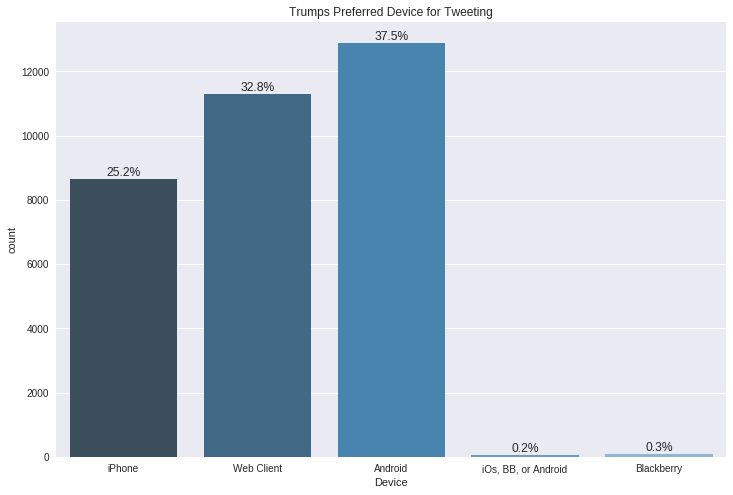

In [8]:
major_tweet_device = tweets[tweets['source'].str.contains('Android|iPhone|Web Client|Blackberry',regex=True)]

fig = plt.figure(figsize=(12,8))
ax = sns.countplot(x='source',data=major_tweet_device, palette='Blues_d')
ax.set_title('Trumps Preferred Device for Tweeting')
ax.set_xlabel('Device')

#Percent of Tweets per Device centered above each bar
ncount = len(tweets)
for p in ax.patches:
    x=p.get_bbox().get_points()[:,0]
    y=p.get_bbox().get_points()[1,1]
    ax.annotate('{:.1f}%'.format(100.*y/ncount), (x.mean(), y), 
            ha='center', va='bottom')
    
plt.show();

In [9]:
pd.Series(major_tweet_device['source'].value_counts()).sort_values(ascending=False)

Android                12898
Web Client             11298
iPhone                  8656
Blackberry                92
iOs, BB, or Android       55
Name: source, dtype: int64

#Tweets by Hour of the Day

In [10]:
tweets.head()

,Unnamed: 0,source,text,created_at,retweet_count,favorite_count,is_retweet,id_str
0,0,iPhone,Today in Florida @FLOTUS and I were honored to...,2019-03-22 20:15:46,21035.0,93726,False,1.109187e+18
1,1,iPhone,It was announced today by the U.S. Treasury th...,2019-03-22 17:22:59,19505.0,83045,False,1.109143e+18
2,2,iPhone,It is my pleasure to announce that @StephenMoo...,2019-03-22 16:47:33,15383.0,70848,False,1.109135e+18
3,3,iPhone,....There is nothing to admire about them they...,2019-03-22 16:15:05,16870.0,90338,False,1.109126e+18
4,4,iPhone,ISIS uses the internet better than almost anyo...,2019-03-22 16:15:04,20942.0,108340,False,1.109126e+18


/usr/local/lib/python3.6/dist-packages/seaborn/categorical.py:1428: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  stat_data = remove_na(group_data)


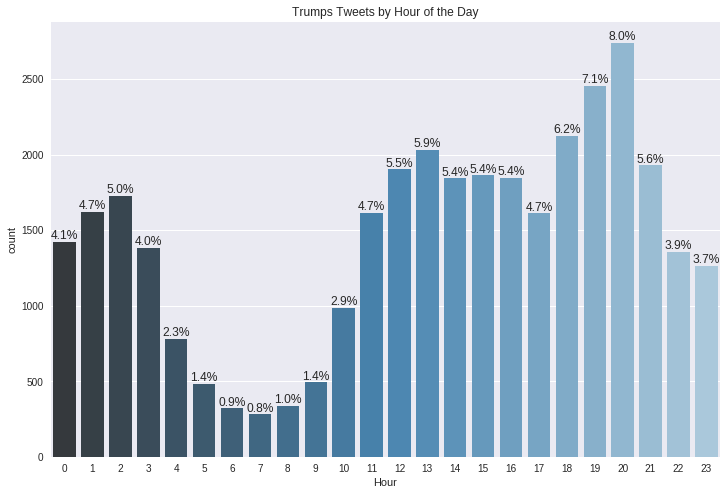

In [11]:
fig = plt.figure(figsize=(12,8))
ax = sns.countplot(tweets['created_at'].dt.hour, palette='Blues_d')
ax.set_title('Trumps Tweets by Hour of the Day')
ax.set_xlabel('Hour')

#Percent of Tweets per Hour centered above each bar
ncount = len(tweets)
for p in ax.patches:
    x=p.get_bbox().get_points()[:,0]
    y=p.get_bbox().get_points()[1,1]
    ax.annotate('{:.1f}%'.format(100.*y/ncount), (x.mean(), y), 
            ha='center', va='bottom')
    
plt.show();

In [12]:
pd.Series(tweets['created_at'].dt.hour.value_counts()).sort_index()

0     1421
1     1623
2     1726
3     1383
4      781
5      481
6      321
7      281
8      337
9      493
10     987
11    1616
12    1902
13    2031
14    1843
15    1863
16    1844
17    1611
18    2122
19    2455
20    2741
21    1929
22    1354
23    1262
Name: created_at, dtype: int64

#Word Cloud

In [0]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from google.colab import files

In [0]:
text = " ".join(tweet for tweet in tweets['text'])
no_urls_no_tags = " ".join([word for word in text.split()
                            if 'http' not in word
                                and not word.startswith('@real')
                                and word != 'RT'
                            ])

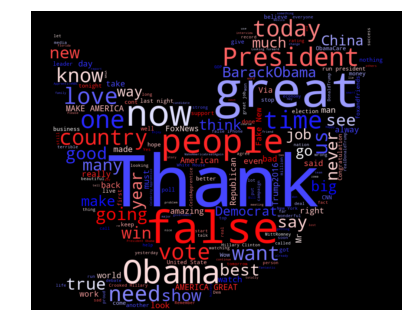

In [57]:
from imageio import imread
twitter_mask =imread('/content/twitter_mask.png')

# Create stopword list:
stopwords = set(STOPWORDS)
stopwords.update(['Trump','Donald','Donald Trump','Twitter','Android',
                  'Web Client','https','co','Web','Client','amp','RT','will'])

# Generate a word cloud image
wordcloud = WordCloud(stopwords=stopwords, background_color="black", colormap='bwr', 
                      width=1800, height=1400, mask=twitter_mask).generate(no_urls_no_tags)

# Display the generated image:
# the matplotlib way:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
#plt.show()

plt.savefig('presidential_tweets.png', format='png', dpi=300)
files.download('presidential_tweets.png')

In [82]:
from collections import Counter

Counter(text).values()

dict_values([47461, 258292, 111879, 270825, 69701, 700272, 211236, 226126, 9043, 151523, 220147, 40350, 10149, 13847, 7681, 21037, 22568, 59854, 360837, 133487, 275886, 85559, 91507, 180869, 55551, 13146, 22406, 16075, 83097, 103805, 49345, 11354, 7515, 22188, 30300, 30360, 57946, 14038, 34129, 6245, 21285, 67372, 8217, 16137, 5180, 32370, 17626, 468, 1787, 13422, 12267, 13350, 13746, 2148, 7603, 1754, 1812, 27037, 13336, 2097, 2771, 25428, 14687, 25978, 14024, 9395, 1272, 43, 16301, 5802, 7383, 11138, 21957, 5622, 3505, 901, 1999, 1796, 10502, 3575, 3649, 799, 10906, 3333, 553, 23, 3, 123, 11, 10, 84, 227, 4429, 302, 302, 2979, 79, 15, 2, 1, 27, 5, 3, 3, 11, 12, 5, 2, 8, 11, 3, 4, 2, 8, 1, 6, 5, 7, 1, 1, 2, 1, 7, 4, 1, 3, 13, 4, 3, 13, 3, 2, 1, 7, 1, 7, 1, 1, 1, 1, 1, 1, 6, 5, 2, 1, 14, 8, 8, 8, 4, 7, 1, 4, 8, 1, 4, 14, 4, 4, 6, 4, 4, 1, 1, 1, 4, 1, 10, 2, 2, 5, 6, 7, 5, 3, 1, 1, 1, 11, 3, 3, 3, 1, 7, 2, 1, 1, 1, 1, 3, 1, 1, 1, 2, 4, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 2, 3, 3, 1, 4, 4, 

In [93]:
test = pd.Series(text.split())
test.value_counts()

the                                                                                                                               21938
to                                                                                                                                15221
and                                                                                                                               11353
a                                                                                                                                 10831
of                                                                                                                                10143
is                                                                                                                                 9935
for                                                                                                                                9689
in                                              

In [84]:
text_list = text.split()
wordfreq = []
for w in text_list:
    wordfreq.append(text_list.count(w))

frequency = zip(text_list, wordfreq)
frequency

KeyboardInterrupt: ignored